In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.core.interactiveshell import InteractiveShell
from tqdm import tqdm

InteractiveShell.ast_node_interactivity = "all"

In [2]:
root_dir = "/app/_data/artist_data/"
train = pd.read_csv(os.path.join(root_dir, "train_meta.tsv"), sep="\t")
test = pd.read_csv(os.path.join(root_dir, "test_meta.tsv"), sep="\t")

## EDA

In [3]:
train.head()

,trackid,artistid,archive_features_path
0,1,1,1/1/0/1.npy
1,2,2,2/2/0/2.npy
2,3,3,3/3/0/3.npy
3,4,4,4/4/0/4.npy
4,5,5,5/5/0/5.npy


In [4]:
test.head()

,trackid,archive_features_path
0,167197,7/9/167197.npy
1,167198,8/9/167198.npy
2,167199,9/9/167199.npy
3,167200,0/0/167200.npy
4,167201,1/0/167201.npy


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167196 entries, 0 to 167195
Data columns (total 3 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   trackid                167196 non-null  int64 
 1   artistid               167196 non-null  int64 
 2   archive_features_path  167196 non-null  object
dtypes: int64(2), object(1)
memory usage: 3.8+ MB


In [6]:
train["artistid"].unique().shape[0]
train["trackid"].unique().shape[0] == train.shape[0]

18468

True

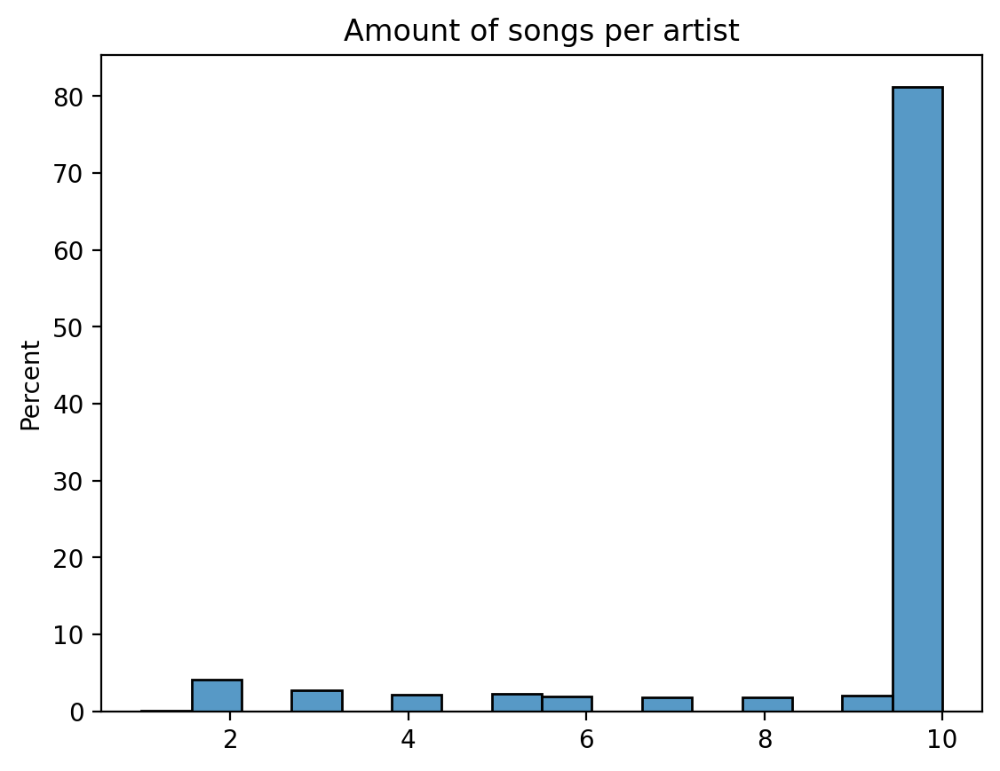

In [7]:
sns.histplot(train[["artistid"]].value_counts(), stat="percent")
plt.title("Amount of songs per artist")
plt.show();

In [8]:
train["path"] = train["archive_features_path"].apply(
    lambda x: os.path.join(root_dir, "train_features", x)
)
test["path"] = test["archive_features_path"].apply(
    lambda x: os.path.join(root_dir, "test_features", x)
)

In [9]:
def get_array_info(df):
    for i in tqdm(range(df.shape[0])):
        sample = np.load(df.loc[i, "path"])
        df.loc[i, "max"] = sample.max()
        df.loc[i, "min"] = sample.min()
        df.loc[i, "mean"] = sample.mean()
        df.loc[i, "std"] = np.std(sample)
        df.loc[i, "width"] = sample.shape[1]
        df.loc[i, "height"] = sample.shape[0]
    return df

In [10]:
train = get_array_info(train)
test = get_array_info(test)

100% 167196/167196 [04:32<00:00, 614.54it/s]
100% 41377/41377 [01:21<00:00, 508.19it/s]


In [11]:
train = train.merge(
    train["artistid"].value_counts(),
    left_on="artistid",
    right_index=True,
    suffixes=[None, "_count"],
)

In [12]:
train = train.sort_values("artistid").reset_index(drop=True)
train.to_csv(os.path.join(root_dir, "train.csv"), index=False)
artist_ids = train["artistid"].unique().tolist()

## stat

In [13]:
train[["max", "min", "mean", "width", "height", "std"]].describe()

,max,min,mean,width,height,std
count,167196.000000,167196.0,167196.000000,167196.000000,167196.0,167196.000000
mean,4.441742,0.0,0.405640,80.952529,512.0,0.371243
std,0.933821,0.0,0.034012,0.779919,0.0,0.034293
min,2.200502,0.0,0.139183,61.000000,512.0,0.254442
25%,3.801422,0.0,0.388222,81.000000,512.0,0.348375
50%,4.264542,0.0,0.412320,81.000000,512.0,0.368504
75%,4.886069,0.0,0.429258,81.000000,512.0,0.390928
max,13.249526,0.0,0.565380,81.000000,512.0,0.728710


In [14]:
test[["max", "min", "mean", "width", "height", "std"]].describe()

,max,min,mean,width,height,std
count,41377.000000,41377.0,41377.000000,41377.000000,41377.0,41377.000000
mean,4.436992,0.0,0.405778,80.959567,512.0,0.371109
std,0.927165,0.0,0.033398,0.733206,0.0,0.034099
min,2.231172,0.0,0.139183,61.000000,512.0,0.269255
25%,3.804988,0.0,0.388190,81.000000,512.0,0.348401
50%,4.261109,0.0,0.412171,81.000000,512.0,0.368461
75%,4.874263,0.0,0.429164,81.000000,512.0,0.390730
max,13.207655,0.0,0.501845,81.000000,512.0,0.648200


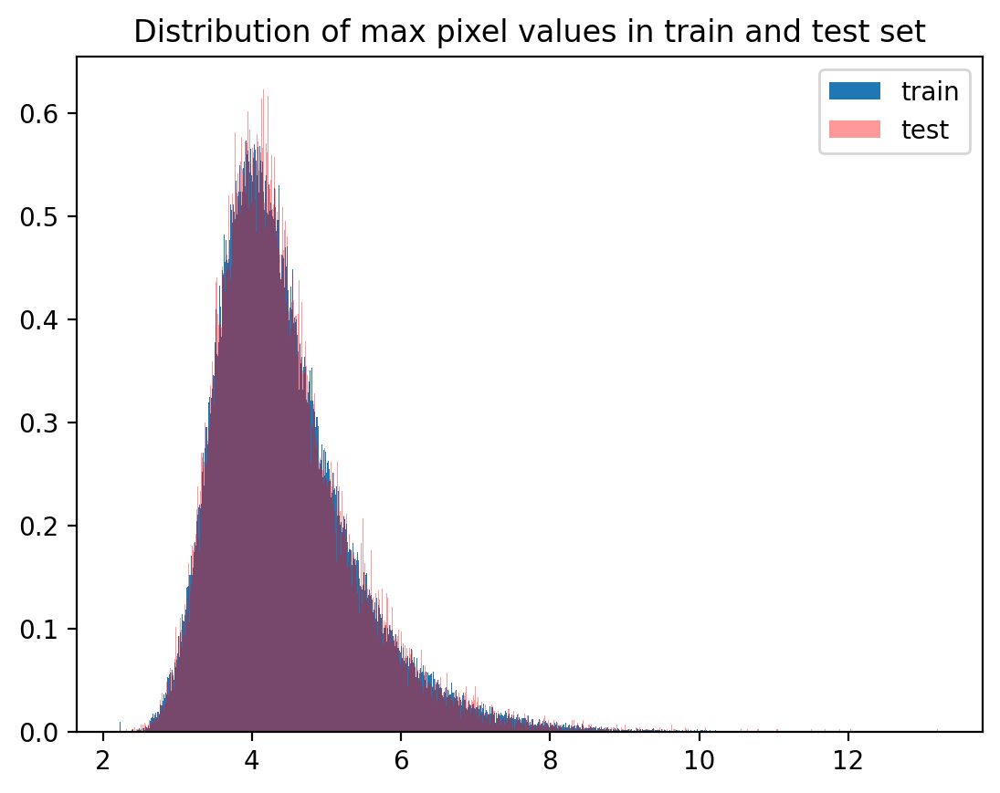

In [15]:
plt.title("Distribution of max pixel values in train and test set")
plt.hist(train["max"], density=True, bins=1000, label="train")
plt.hist(test["max"], density=True, bins=1000, label="test", alpha=0.4, color="r")
plt.legend()
plt.show();

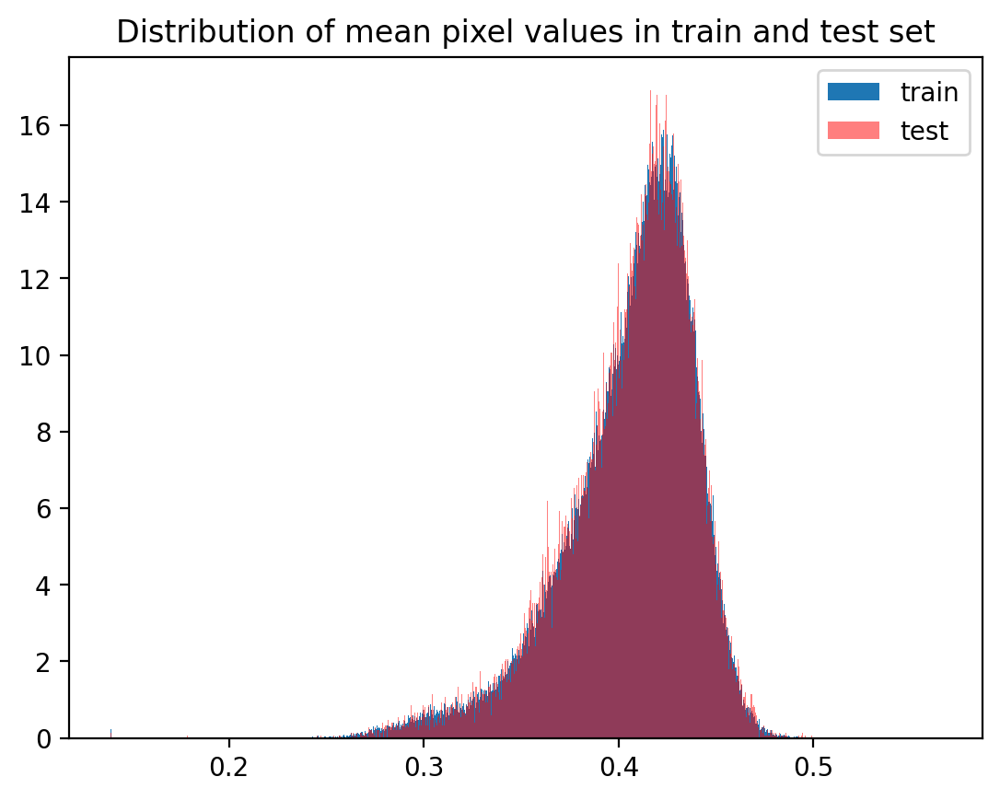

In [16]:
plt.title("Distribution of mean pixel values in train and test set")
plt.hist(train["mean"], density=True, bins=1000, label="train")
plt.hist(test["mean"], density=True, bins=1000, label="test", alpha=0.5, color="r")
plt.legend()
plt.show();

In [17]:
pd.DataFrame(train["width"].value_counts() * 100 / train.shape[0]).join(
    pd.DataFrame(test["width"].value_counts() * 100 / test.shape[0]),
    lsuffix="_train",
    rsuffix="_test",
)

,width_train,width_test
81.0,99.512548,99.601228
74.0,0.031101,0.021751
73.0,0.029905,0.012084
79.0,0.029307,0.019334
78.0,0.028111,0.021751
68.0,0.027513,0.021751
77.0,0.026915,0.019334
69.0,0.026316,0.021751
72.0,0.026316,0.016918
80.0,0.025718,0.024168


## Visualization

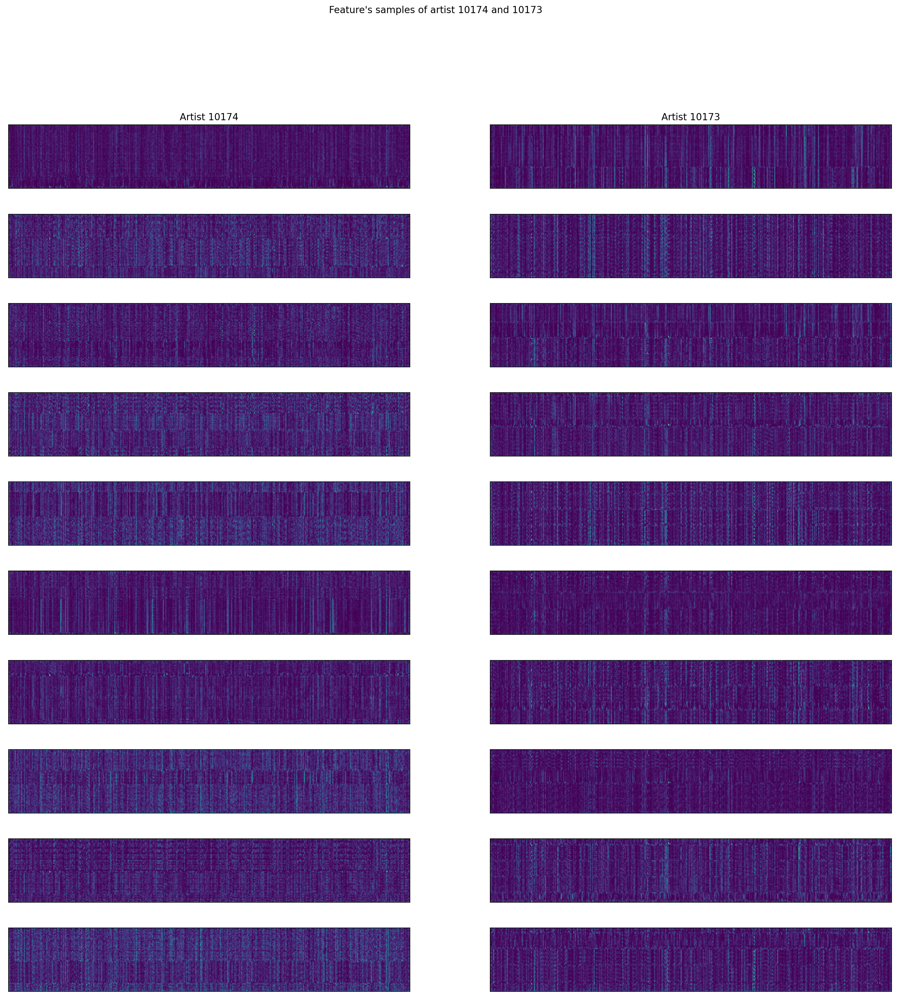

In [18]:
n_plots = 10
sample_artist1, sample_artist2 = (
    train.query("artistid_count >= @n_plots").sample(2)["artistid"].values
)
paths1 = train[train["artistid"] == sample_artist1]["path"].values
paths2 = train[train["artistid"] == sample_artist2]["path"].values

plt.figure(figsize=(20, 2 * n_plots))
plt.suptitle(f"Feature's samples of artist {sample_artist1} and {sample_artist2}")
for i in range(n_plots):
    sample1 = np.load(paths1[i])
    sample1/=sample1.max()
    sample2 = np.load(paths2[i])
    sample2/=sample2.max()
    plt.subplot(n_plots, 2, 2 * i + 1)
    if i == 0:
        plt.title(f"Artist {sample_artist1}")
    plt.imshow(sample1.transpose(1, 0))
    plt.yticks([])
    plt.xticks([])
    plt.subplot(n_plots, 2, 2 * i + 2)
    if i == 0:
        plt.title(f"Artist {sample_artist2}")
    plt.imshow(sample2.transpose(1, 0))
    plt.yticks([])
    plt.xticks([])
plt.yticks([])
plt.xticks([])
plt.show();

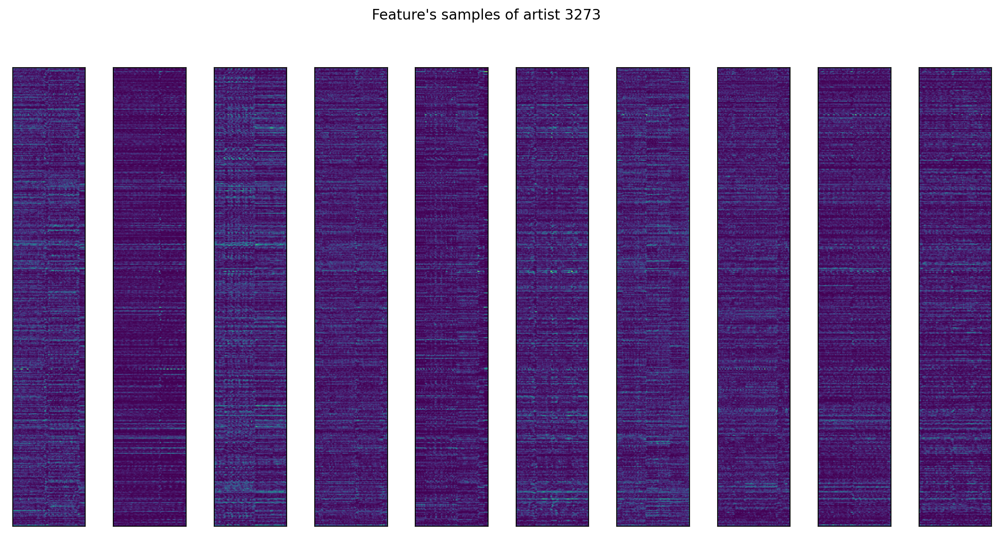

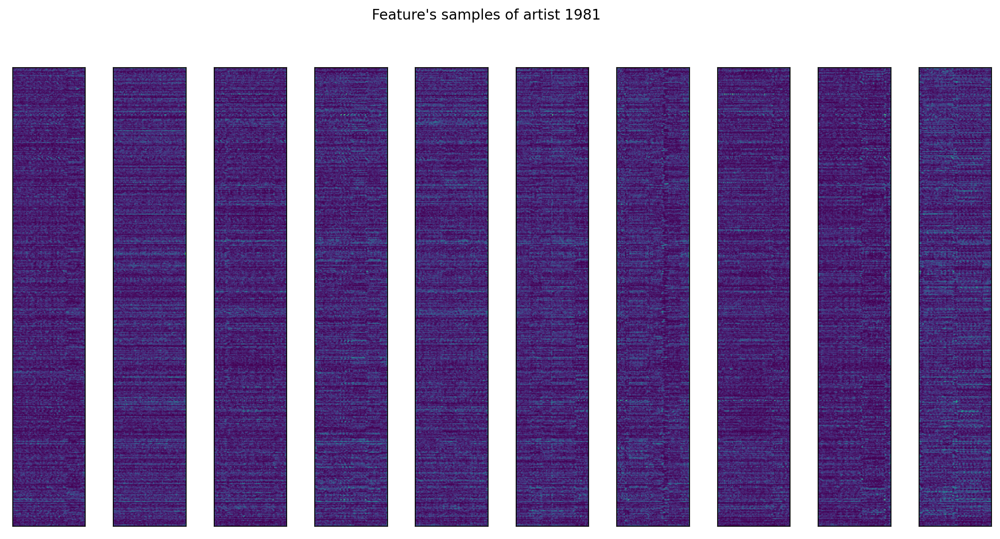

In [19]:
n_plots = 10
sample_artists = train.query("artistid_count >= @n_plots").sample(2)["artistid"].values
paths = [
    train[train["artistid"] == sample_artist]["path"].values
    for sample_artist in sample_artists
]

for p in range(2):
    plt.figure(figsize=(15, 7))
    plt.suptitle(f"Feature's samples of artist {sample_artists[p]}")
    for i in range(n_plots):
        sample = np.load(paths[p][i])
        sample/=sample.max()
        plt.subplot(1, n_plots, i + 1)
        plt.imshow(sample)
        plt.yticks([])
        plt.xticks([])
plt.show();